In [1]:
# 구글 드라이브 마운트
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/Seoul/data

/content/drive/MyDrive/Seoul/data


### 라이브러리 로드

In [3]:
import os
import json
import folium
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import geopandas as gpd #지도

import warnings
warnings.filterwarnings('ignore')

In [4]:
# !sudo apt-get install -y fonts-nanum
# !sudo fc-cache -fv
# !rm ~/.cache/matplotlib -rf

In [4]:
# 한글폰트 설정
plt.rc('font', family='NanumBarunGothic')

In [5]:
# 동 데이터
dong = pd.read_csv('0.거주인구특성.csv', encoding='cp949')
dong.head()

,시군구명,행정동명,전체세대,1인세대,기초생활수급자,외국인,행정구역코드,행정동코드,총인구수,노령층인구,노령층비율,장애인인구,장애인비율,차상위인구,차상위비율,cluster,1인세대비율,기초생활수급자비율,외국인비율
0,종로구,청운효자동,5129.0,1952.0,162.0,229.0,1101072,11110515,12024,2915,0.001272,228.0,0.000577,1,0.000006,1,0.000999,0.000560,0.000534
1,종로구,사직동,4570.0,2317.0,112.0,404.0,1101053,11110530,9371,2472,0.001079,432.0,0.001094,74,0.000480,1,0.001185,0.000387,0.000942
2,종로구,삼청동,1148.0,563.0,38.0,87.0,1101054,11110540,2498,834,0.000364,542.0,0.001373,65,0.000422,1,0.000288,0.000131,0.000203
3,종로구,부암동,4144.0,1642.0,135.0,379.0,1101055,11110550,9703,2535,0.001106,587.0,0.001487,182,0.001181,1,0.000840,0.000467,0.000883
4,종로구,평창동,7270.0,2321.0,107.0,430.0,1101056,11110560,18204,4877,0.002128,505.0,0.001279,172,0.001116,1,0.001188,0.000370,0.001002


In [6]:
dong.drop('cluster', axis=1, inplace=True)
dong.head()

,시군구명,행정동명,전체세대,1인세대,기초생활수급자,외국인,행정구역코드,행정동코드,총인구수,노령층인구,노령층비율,장애인인구,장애인비율,차상위인구,차상위비율,1인세대비율,기초생활수급자비율,외국인비율
0,종로구,청운효자동,5129.0,1952.0,162.0,229.0,1101072,11110515,12024,2915,0.001272,228.0,0.000577,1,0.000006,0.000999,0.000560,0.000534
1,종로구,사직동,4570.0,2317.0,112.0,404.0,1101053,11110530,9371,2472,0.001079,432.0,0.001094,74,0.000480,0.001185,0.000387,0.000942
2,종로구,삼청동,1148.0,563.0,38.0,87.0,1101054,11110540,2498,834,0.000364,542.0,0.001373,65,0.000422,0.000288,0.000131,0.000203
3,종로구,부암동,4144.0,1642.0,135.0,379.0,1101055,11110550,9703,2535,0.001106,587.0,0.001487,182,0.001181,0.000840,0.000467,0.000883
4,종로구,평창동,7270.0,2321.0,107.0,430.0,1101056,11110560,18204,4877,0.002128,505.0,0.001279,172,0.001116,0.001188,0.000370,0.001002


### 동 선별하기
구에서 선별된 동만 추출하여 3가지 지표로 pca 진행 -> 가중치 추출

- 신체
- 소득
- 연령

In [7]:
# 선별된 동만 추출
select_gu = ['강북구', '노원구', '도봉구', '종로구']
dong_s = dong[dong['시군구명'].isin(select_gu)]
len(dong_s)

63

In [8]:
dong_s['저소득층'] = dong_s['기초생활수급자'] + dong['차상위인구']
dong_s['저소득층비율'] = dong_s['저소득층'] / sum(dong_s['저소득층'])
dong_s[['저소득층비율','저소득층']].head()

,저소득층비율,저소득층
0,0.002015,163.0
1,0.002299,186.0
2,0.001273,103.0
3,0.003919,317.0
4,0.003449,279.0


In [9]:
dong_s = dong_s[['행정구역코드','시군구명','행정동명','노령층인구','노령층비율','장애인인구','장애인비율','저소득층','저소득층비율']]
dong_s.head()

,행정구역코드,시군구명,행정동명,노령층인구,노령층비율,장애인인구,장애인비율,저소득층,저소득층비율
0,1101072,종로구,청운효자동,2915,0.001272,228.0,0.000577,163.0,0.002015
1,1101053,종로구,사직동,2472,0.001079,432.0,0.001094,186.0,0.002299
2,1101054,종로구,삼청동,834,0.000364,542.0,0.001373,103.0,0.001273
3,1101055,종로구,부암동,2535,0.001106,587.0,0.001487,317.0,0.003919
4,1101056,종로구,평창동,4877,0.002128,505.0,0.001279,279.0,0.003449


In [10]:
dong_s[['시군구명','행정동명']+['노령층비율','장애인비율','저소득층비율']]

,시군구명,행정동명,노령층비율,장애인비율,저소득층비율
0,종로구,청운효자동,0.001272,0.000577,0.002015
1,종로구,사직동,0.001079,0.001094,0.002299
2,종로구,삼청동,0.000364,0.001373,0.001273
3,종로구,부암동,0.001106,0.001487,0.003919
4,종로구,평창동,0.002128,0.001279,0.003449
...,...,...,...,...,...
171,노원구,상계5동,0.003117,0.001679,0.035170
172,노원구,상계6·7동,0.003195,0.004047,0.013042
173,노원구,상계8동,0.001800,0.002016,0.013128
174,노원구,상계9동,0.002188,0.002353,0.013512


### 주성분분석

#### PCA

In [11]:
pca_c = ['노령층비율','장애인비율','저소득층비율']

In [12]:
from sklearn.preprocessing import RobustScaler
# 스케일링
scaler = RobustScaler()
dong_scale = dong_s.copy()
dong_scale[pca_c] = scaler.fit_transform(dong_scale[pca_c])

In [13]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3) # 주성분 개수
printcipalComponents = pca.fit_transform(dong_scale[pca_c])

In [14]:
# 주성분으로 이루어진 데이터 프레임 구성
pca_df = pd.DataFrame(data=printcipalComponents, columns = ['PCA1', 'PCA2', 'PCA3'])
pca_df.head()

,PCA1,PCA2,PCA3
0,-1.554088,-0.257910,-0.097305
1,-1.391836,-0.466162,-0.019139
2,-1.484940,-0.870664,0.218660
3,-1.192908,-0.509209,0.032128
4,-1.028007,-0.038399,-0.399475


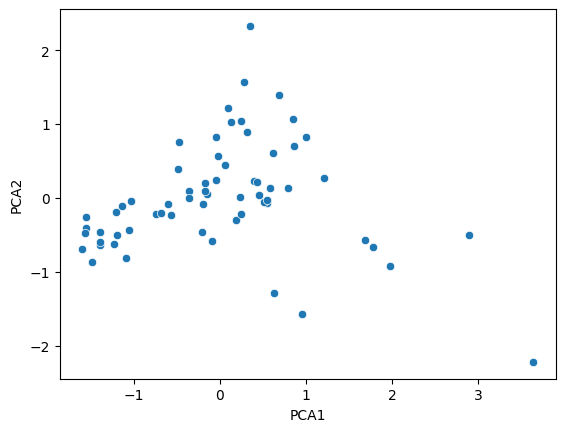

In [15]:
import seaborn as sns
palette = sns.color_palette("bright", 10)
sns.scatterplot(pca_df, x='PCA1', y='PCA2')
plt.show()

In [16]:
# 총설명 분산 비율
pca.explained_variance_ratio_

array([0.60777945, 0.30593291, 0.08628765])

In [17]:
score_df = pd.DataFrame(pca.components_, columns = pca_c)
score_df

,노령층비율,장애인비율,저소득층비율
0,0.395522,0.832889,0.387115
1,0.660485,-0.550813,0.510259
2,-0.638217,-0.053865,0.767970


#### T-SNE

In [18]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=3)
tsne_res = tsne.fit_transform(dong_scale[pca_c])

In [19]:
# 주성분으로 이루어진 데이터 프레임 구성
tsne_df = pd.DataFrame(data=tsne_res, columns = ['TSNE1', 'TSNE2', 'TSNE3'])
tsne_df.head()

,TSNE1,TSNE2,TSNE3
0,108.373756,-82.232864,-44.069561
1,-51.119797,91.355873,73.755447
2,-88.375862,46.697891,86.592781
3,-84.447754,68.332809,38.561218
4,-59.737133,28.516691,12.079984


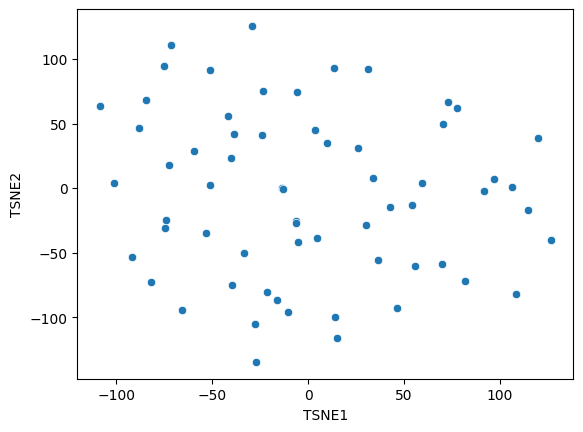

In [20]:
import seaborn as sns
palette = sns.color_palette("bright", 10)
sns.scatterplot(tsne_df, x='TSNE1', y='TSNE2')
plt.show()

#### 점수화하기

In [21]:
pca = PCA(n_components=2) # 주성분 개수
printcipalComponents = pca.fit_transform(dong_scale[pca_c])

In [22]:
pca.explained_variance_ratio_

array([0.60777945, 0.30593291])

In [23]:
score_df = pd.DataFrame(pca.components_, columns = pca_c)
score_df

,노령층비율,장애인비율,저소득층비율
0,0.395522,0.832889,0.387115
1,0.660485,-0.550813,0.510259


In [24]:
tot_score = [0] * 424
for i, col in score_df.iterrows():
  pca_score = [0] * 424
  for w, c in zip(col, pca_c):
    pca_score = [t+w*s for t, s in zip(pca_score, dong_scale[c])]
  w = pca.explained_variance_ratio_[i]
  tot_score = [t + w * s for s,t in zip(pca_score, tot_score)]

print(tot_score)

[-0.9351074045657211, -0.9002057288981763, -1.0805426759153245, -0.7924707220296685, -0.5482110649158061, -0.9790427526848242, -0.8488578001517711, -1.0911660707334143, -0.6365743727527811, -0.9538230861115498, -1.0084615629803286, 0.18614494509011226, 0.07589916058683499, -0.7022584518999986, -0.9419913691721735, -0.8193872706643016, -0.685748771703042, 0.39953524309209776, 0.03602713291051948, 0.9059721403257416, 0.5586229908087395, 0.4037514223999656, 0.9400400079628535, 0.48409181179343946, 1.6954173398855772, 0.9663124292298706, 1.621103239164943, 1.00391630310958, 0.04605345956113401, 0.8293234889487429, 0.11137411152233787, 0.37388434551367206, -0.17925577148493613, 0.1356081214806721, -0.05536251207369762, 0.24717237893879254, 0.31184979570626353, -0.08704157300098549, 0.013155261655584453, 0.23363222996491256, -0.4262946611683649, 0.5539688395570346, 0.2648967033963079, 0.009746190060983477, 0.17247029816531134, 0.9469360321090535, 0.48272150698482585, 0.9292190199961168, 0.60

In [25]:
dong_s['pca_score'] = tot_score
dong_s.sort_values(by='pca_score', ascending=False).head(10)

,행정구역코드,시군구명,행정동명,노령층인구,노령층비율,장애인인구,장애인비율,저소득층,저소득층비율,pca_score
137,1109062,강북구,번3동,6078,0.002652,3374.0,0.008545,3573.0,0.044169,1.695417
139,1109064,강북구,수유2동,6731,0.002937,4741.0,0.012007,1054.0,0.013030,1.621103
167,1111078,노원구,중계2·3동,10043,0.004383,325.0,0.000823,3814.0,0.047149,1.011731
140,1109065,강북구,수유3동,6582,0.002872,2979.0,0.007545,1471.0,0.018185,1.003916
138,1109063,강북구,수유1동,6287,0.002743,2715.0,0.006876,1847.0,0.022833,0.966312
158,1111052,노원구,월계2동,8266,0.003607,1482.0,0.003753,2692.0,0.033279,0.946936
135,1109060,강북구,번1동,5134,0.002240,2577.0,0.006527,2456.0,0.030361,0.940040
170,1111076,노원구,상계3·4동,8541,0.003727,1266.0,0.003206,2848.0,0.035207,0.936965
160,1111079,노원구,공릉1동,9550,0.004167,1015.0,0.002571,2742.0,0.033897,0.929219
132,1109071,강북구,송중동,8529,0.003722,1901.0,0.004815,1828.0,0.022598,0.905972


In [26]:
dong_s['pca_score'].mean()

0.08833819586573166

In [27]:
dong_s['pca_score'].min(), dong_s['pca_score'].max()

(-1.0911660707334143, 1.6954173398855772)

In [29]:
for n in ('강북구', '노원구', '도봉구', '종로구'):
  print(n)
  display(dong_s.loc[dong_s['시군구명']==n, ['행정동명','pca_score']].sort_values(by='pca_score', ascending=False))
  print('')

강북구


,행정동명,pca_score
137,번3동,1.695417
139,수유2동,1.621103
140,수유3동,1.003916
138,수유1동,0.966312
135,번1동,0.940040
132,송중동,0.905972
142,인수동,0.829323
133,송천동,0.558623
136,번2동,0.484092
134,삼각산동,0.403751



노원구


,행정동명,pca_score
167,중계2·3동,1.011731
158,월계2동,0.946936
170,상계3·4동,0.936965
160,공릉1동,0.929219
168,상계1동,0.737718
162,하계1동,0.650361
161,공릉2동,0.608905
171,상계5동,0.518818
159,월계3동,0.482722
166,중계4동,0.417760



도봉구


,행정동명,pca_score
154,방학1동,0.553969
144,창2동,0.373884
149,도봉2동,0.311850
155,방학2동,0.264897
148,도봉1동,0.247172
152,쌍문3동,0.233632
146,창4동,0.135608
143,창1동,0.111374
151,쌍문2동,0.013155
156,방학3동,0.009746



종로구


,행정동명,pca_score
11,혜화동,0.186145
12,창신1동,0.075899
4,평창동,-0.548211
8,종로1·2·3·4가동,-0.636574
16,숭인2동,-0.685749
13,창신2동,-0.702258
3,부암동,-0.792471
15,숭인1동,-0.819387
6,교남동,-0.848858
1,사직동,-0.900206


In [27]:
# 지도 시각화 geo.json 파일로드 및 서울시만 추출
with open('geo.json', 'r') as f:
  data = json.load(f)

feat, d_code = [], {}
for d in data['features']:
  # print((d['properties']['code']))
  # break
  c, n = d['properties']['code'], d['properties']['name']
  if c < '2000000':
    feat.append(d)
    if n in d_code:
      print(n, c, d_code[n])
    else:
      d_code[n] = c

data['features'] = feat

신사동 1123051 1121068


In [28]:
dong_s['행정구역코드'] = dong_s['행정구역코드'].astype(str)
dong_s['행정구역코드'] = [d_code[d] for d in dong_s['행정동명']]
dong_s['행정구역코드'].info()

<class 'pandas.core.series.Series'>
Int64Index: 63 entries, 0 to 175
Series name: 행정구역코드
Non-Null Count  Dtype 
--------------  ----- 
63 non-null     object
dtypes: object(1)
memory usage: 3.0+ KB


In [29]:
# 지도시각화 함수 - 컬럼, 지도데이터, 색상
def plot_dong(data, df, colname, color, tooltip=True):
  m1 = folium.Map(location=[37.5502, 126.982], tiles='cartodbpositron', zoom_start=11)

  m1.choropleth(
      geo_data=data,
      name = colname,
      data = df,
      columns = ['행정구역코드', colname],
      key_on='properties.code',
      fill_color=color,
      highlight=True,
      fill_opacity=0.7,
      line_opacity=0.5,
      legend_name=colname
  )

  style_function = lambda x: {'fillColor': '#ffffff',
                              'color':'#000000',
                              'fillOpacity': 0.1,
                              'weight': 0.1}

  highlight_function = lambda x: {'fillColor': '#000000',
                                  'color':'#000000',
                                  'fillOpacity': 0.50,
                                  'weight': 0.1}
  if tooltip:
    SuburbName = folium.features.GeoJson(
        data,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.features.GeoJsonTooltip(
            fields=['name', 'code', colname],
            aliases=['행정동명','행정구역코드', colname],
            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
            sticky=True
            )
        )
  else:
    SuburbName = folium.features.GeoJson(
        data,
        style_function=style_function,
        control=False,
        highlight_function=highlight_function,
        tooltip=folium.features.GeoJsonTooltip(
            fields=['name', 'code'],
            aliases=['행정동명','행정구역코드'],
            style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;"),
            sticky=True
            )
      )
  m1.add_child(SuburbName)
  m1.keep_in_front(SuburbName)
  folium.LayerControl().add_to(m1)

  return m1

In [100]:
plot_dong(data, dong_s, 'pca_score', 'YlOrRd', False)

In [34]:
top = dong_s.groupby(by='시군구명', as_index=False)['pca_score'].max()
top

,시군구명,pca_score
0,강북구,1.695417
1,노원구,1.011731
2,도봉구,0.553969
3,종로구,0.186145


In [47]:
top = dong_s.groupby(by='시군구명', as_index=False)['pca_score'].max()
for i, row in top.iterrows():
  n, s = row['시군구명'], row['pca_score']
  print(n, dong_s[(dong_s['시군구명']==n) & (dong_s['pca_score']==s)]['행정동명'].values[0], s)

강북구 번3동 1.6954173398855772
노원구 중계2·3동 1.0117310734980034
도봉구 방학1동 0.5539688395570346
종로구 혜화동 0.18614494509011226


In [48]:
dong.head()

,시군구명,행정동명,전체세대,1인세대,기초생활수급자,외국인,행정구역코드,행정동코드,총인구수,노령층인구,노령층비율,장애인인구,장애인비율,차상위인구,차상위비율,1인세대비율,기초생활수급자비율,외국인비율
0,종로구,청운효자동,5129.0,1952.0,162.0,229.0,1101072,11110515,12024,2915,0.001272,228.0,0.000577,1,0.000006,0.000999,0.000560,0.000534
1,종로구,사직동,4570.0,2317.0,112.0,404.0,1101053,11110530,9371,2472,0.001079,432.0,0.001094,74,0.000480,0.001185,0.000387,0.000942
2,종로구,삼청동,1148.0,563.0,38.0,87.0,1101054,11110540,2498,834,0.000364,542.0,0.001373,65,0.000422,0.000288,0.000131,0.000203
3,종로구,부암동,4144.0,1642.0,135.0,379.0,1101055,11110550,9703,2535,0.001106,587.0,0.001487,182,0.001181,0.000840,0.000467,0.000883
4,종로구,평창동,7270.0,2321.0,107.0,430.0,1101056,11110560,18204,4877,0.002128,505.0,0.001279,172,0.001116,0.001188,0.000370,0.001002


In [49]:
dong['행정구역코드'] = dong['행정구역코드'].astype(str)
dong['행정구역코드'] = [d_code[d] for d in dong['행정동명']]
dong['행정구역코드'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 424 entries, 0 to 423
Series name: 행정구역코드
Non-Null Count  Dtype 
--------------  ----- 
424 non-null    object
dtypes: object(1)
memory usage: 3.4+ KB


In [51]:
dong['저소득층'] = dong['기초생활수급자'] + dong['차상위인구']
dong['저소득층비율'] = dong['저소득층'] / sum(dong['저소득층'])
dong[['저소득층비율','저소득층']].head()

,저소득층비율,저소득층
0,0.000368,163.0
1,0.000420,186.0
2,0.000232,103.0
3,0.000715,317.0
4,0.000630,279.0


In [57]:
dong.loc[(dong['시군구명']=='관악구')&(dong['행정동명']=='신사동'), '행정구역코드'] = '1121068'
dong.loc[(dong['시군구명']=='강남구')&(dong['행정동명']=='신사동'), '행정구역코드'] = '1123051'

In [58]:
plot_dong(data, dong, '저소득층비율', 'Reds', False)

In [59]:
plot_dong(data, dong, '노령층비율', 'Reds', False)

In [60]:
plot_dong(data, dong, '장애인비율', 'Reds', False)

In [61]:
dong_s.columns

Index(['행정구역코드', '시군구명', '행정동명', '노령층인구', '노령층비율', '장애인인구', '장애인비율', '저소득층',
       '저소득층비율', 'pca_score'],
      dtype='object')

In [71]:
dong[['차상위비율','기초생활수급자비율','노령층비율','장애인비율']].corr()

,차상위비율,기초생활수급자비율,노령층비율,장애인비율
차상위비율,1.000000,0.124164,0.015713,0.145472
기초생활수급자비율,0.124164,1.000000,0.637410,0.024394
노령층비율,0.015713,0.637410,1.000000,-0.011757
장애인비율,0.145472,0.024394,-0.011757,1.000000


In [73]:
dong[['저소득층비율','노령층비율','장애인비율']].corr()

,저소득층비율,노령층비율,장애인비율
저소득층비율,1.000000,0.535053,0.088194
노령층비율,0.535053,1.000000,-0.011757
장애인비율,0.088194,-0.011757,1.000000


In [64]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 19 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 1s (19.0 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 120874 files and direc

In [67]:
# 한글폰트 설정
plt.rc('font', family='NanumBarunGothic')

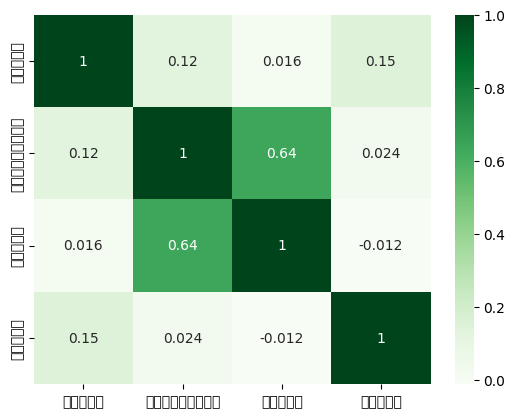

In [72]:
sns.heatmap(dong[['차상위비율','기초생활수급자비율','노령층비율','장애인비율']].corr(), annot=True, cmap='Greens')
plt.show()

In [30]:
s = MinMaxScaler()
dong_s['pca_score_s'] = s.fit_transform(dong_s[['pca_score']])

In [87]:
dong_score = dong.merge(dong_s[['행정구역코드', 'pca_score_s']], on='행정구역코드', how='left')
dong_score.head()

,시군구명,행정동명,전체세대,1인세대,기초생활수급자,외국인,행정구역코드,행정동코드,총인구수,노령층인구,...,장애인인구,장애인비율,차상위인구,차상위비율,1인세대비율,기초생활수급자비율,외국인비율,저소득층,저소득층비율,pca_score_s
0,종로구,청운효자동,5129.0,1952.0,162.0,229.0,1101072,11110515,12024,2915,...,228.0,0.000577,1,0.000006,0.000999,0.000560,0.000534,163.0,0.000368,0.056004
1,종로구,사직동,4570.0,2317.0,112.0,404.0,1101053,11110530,9371,2472,...,432.0,0.001094,74,0.000480,0.001185,0.000387,0.000942,186.0,0.000420,0.068528
2,종로구,삼청동,1148.0,563.0,38.0,87.0,1101054,11110540,2498,834,...,542.0,0.001373,65,0.000422,0.000288,0.000131,0.000203,103.0,0.000232,0.003812
3,종로구,부암동,4144.0,1642.0,135.0,379.0,1101055,11110550,9703,2535,...,587.0,0.001487,182,0.001181,0.000840,0.000467,0.000883,317.0,0.000715,0.107191
4,종로구,평창동,7270.0,2321.0,107.0,430.0,1101056,11110560,18204,4877,...,505.0,0.001279,172,0.001116,0.001188,0.000370,0.001002,279.0,0.000630,0.194846


In [88]:
dong_score['pca_score_s'].fillna(-0.05, inplace=True)

In [89]:
plot_dong(data, dong_score, 'pca_score_s', 'Reds', False)

In [32]:
top = dong_s.groupby(by='시군구명', as_index=False)['pca_score_s'].max()
for i, row in top.iterrows():
  n, s = row['시군구명'], row['pca_score_s']
  print(n, dong_s[(dong_s['시군구명']==n) & (dong_s['pca_score_s']==s)]['행정동명'].values[0], s)

강북구 번3동 1.0
노원구 중계2·3동 0.7546507081818503
도봉구 방학1동 0.590377056011042
종로구 혜화동 0.4583788918558852


In [35]:
for n in ('강북구', '노원구', '도봉구', '종로구'):
  print(n)
  display(dong_s.loc[dong_s['시군구명']==n, ['행정동명','pca_score_s']].sort_values(by='pca_score_s', ascending=False))
  print('')

강북구


,행정동명,pca_score_s
137,번3동,1.000000
139,수유2동,0.973331
140,수유3동,0.751846
138,수유1동,0.738352
135,번1동,0.728923
132,송중동,0.716698
142,인수동,0.689191
133,송천동,0.592047
136,번2동,0.565301
134,삼각산동,0.536470



노원구


,행정동명,pca_score_s
167,중계2·3동,0.754651
158,월계2동,0.731398
170,상계3·4동,0.727820
160,공릉1동,0.725040
168,상계1동,0.656318
162,하계1동,0.624969
161,공릉2동,0.610091
171,상계5동,0.577763
159,월계3동,0.564809
166,중계4동,0.541497



도봉구


,행정동명,pca_score_s
154,방학1동,0.590377
144,창2동,0.525752
149,도봉2동,0.503490
155,방학2동,0.486640
148,도봉1동,0.480279
152,쌍문3동,0.475420
146,창4동,0.440243
143,창1동,0.431546
151,쌍문2동,0.396299
156,방학3동,0.395076



종로구


,행정동명,pca_score_s
11,혜화동,0.458379
12,창신1동,0.418816
4,평창동,0.194846
8,종로1·2·3·4가동,0.163136
16,숭인2동,0.145489
13,창신2동,0.139564
3,부암동,0.107191
15,숭인1동,0.097531
6,교남동,0.086955
1,사직동,0.068528


In [34]:
top['pca_score_s'].mean()

0.7008516640121943

In [33]:
dong_s['pca_score_s'].mean()

0.42327972746279263